Implementation of DCGAN from the paper "Unsupervised Representation Learning with Deep Convolutional Generative Adversarial Networks" by Radford et al. (2016).https://arxiv.org/abs/1511.06434v2

### Discriminator module

In [1]:
import torch
import torch.nn as nn
import torch.nn.init as init

class Discriminator(nn.Module):
    def __init__(self, channels_img, features_d):
        super(Discriminator, self).__init__()
        
        self.model = nn.Sequential(
            # Input size: (64, 64, 3)
            nn.Conv2d(channels_img, features_d, kernel_size=4, stride=2, padding=1), # Output size: (32, 32, features_d)
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(features_d, features_d * 2, kernel_size=4, stride=2, padding=1), # Output size: (16, 16, features_d * 2)
            nn.BatchNorm2d(features_d * 2),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(features_d * 2, features_d * 4, kernel_size=4, stride=2, padding=1), # Output size: (8, 8, features_d * 4)
            nn.BatchNorm2d(features_d * 4),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(features_d * 4, features_d * 8, kernel_size=4, stride=2, padding=1), # Output size: (4, 4, features_d * 8)
            nn.BatchNorm2d(features_d * 8),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(features_d * 8, 1, kernel_size=4, stride=1, padding=0) # Output size: (1, 1, 1)
        )
        
        # Initialize weights
        self._initialize_weights()

    def _initialize_weights(self):
        for m in self.model.modules():
            if isinstance(m, nn.Conv2d):
                init.normal_(m.weight, mean=0, std=0.02)
                if m.bias is not None:
                    init.zeros_(m.bias)
    
    def forward(self, x):
        x = self.model(x)
        x = torch.flatten(x, 1)  # Flatten to shape (batch_size, 1)
        x = torch.sigmoid(x)
        return x

### Generator Module

In [2]:
class Generator(nn.Module):
    def __init__(self, channels_noise, channels_img, features_g):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            # Input: N x channels_noise x 1 x 1
            nn.ConvTranspose2d(channels_noise, features_g * 16, kernel_size=4, stride=1, padding=0),
            nn.BatchNorm2d(features_g * 16),
            nn.ReLU(inplace=True),
            # Output: N x (features_g * 16) x 4 x 4
            
            nn.ConvTranspose2d(features_g * 16, features_g * 8, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(features_g * 8),
            nn.ReLU(inplace=True),
            # Output: N x (features_g * 8) x 8 x 8
            
            nn.ConvTranspose2d(features_g * 8, features_g * 4, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(features_g * 4),
            nn.ReLU(inplace=True),
            # Output: N x (features_g * 4) x 16 x 16
            
            nn.ConvTranspose2d(features_g * 4, features_g * 2, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(features_g * 2),
            nn.ReLU(inplace=True),
            # Output: N x (features_g * 2) x 32 x 32
            
            nn.ConvTranspose2d(features_g * 2, channels_img, kernel_size=4, stride=2, padding=1),
            # Output: N x channels_img x 64 x 64
            
            nn.Tanh()
        )
        self._initialize_weights()
        
    def _initialize_weights(self):
        for m in self.net.modules():
            if isinstance(m, nn.ConvTranspose2d):
                init.normal_(m.weight, mean=0, std=0.02)
                if m.bias is not None:
                    init.zeros_(m.bias)
            elif isinstance(m, nn.BatchNorm2d):
                init.ones_(m.weight)
                init.zeros_(m.bias)

    def forward(self, x):
        return self.net(x)

###  Imports

In [3]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torchvision.utils import save_image
import matplotlib.pyplot as plt
import time
import os


### Hyperparameters

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
LEARNING_RATE = 2e-4
BATCH_SIZE = 128
IMAGE_SIZE = (64, 64)
CHANNELS_IMG = 3
NOISE_DIM = 100
NUM_EPOCHS = 13
FEATURES_DISC = 64
FEATURES_GEN = 64

### Data-Loading and Image Transforms

In [5]:
transform = transforms.Compose([
    transforms.Resize(IMAGE_SIZE),   # Resize images to (64, 64)
    transforms.ToTensor(),            # Convert image to tensor with range [0, 1]
    transforms.Normalize(
        mean=[0.5 for _ in range(CHANNELS_IMG)],  # Normalize with mean 0.5
        std=[0.5 for _ in range(CHANNELS_IMG)]    # Normalize with std 0.5
    )
])

dataset = datasets.ImageFolder(root="/kaggle/input/celeba-dataset/img_align_celeba", transform=transform)

dataloader = DataLoader(
    dataset, 
    batch_size=BATCH_SIZE, 
    shuffle=True,
    num_workers=6,
    pin_memory=True
)

/opt/conda/lib/python3.10/site-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 6 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


### Define Losses

In [6]:
def discriminator_loss(real_output, fake_output):
    real_loss = criterion(torch.ones_like(real_output), real_output)
    fake_loss = criterion(torch.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    return criterion(torch.ones_like(fake_output), fake_output)

### Define Training Process

#### Seed the randomizer

In [7]:
seed = 42
torch.manual_seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)

In [8]:
def train(dataset, epochs, generator, discriminator, gen_optimizer, disc_optimizer, criterion, noise_dim, batch_size, seed):
    for epoch in range(epochs):
        start = time.time()

        gen_losses = []
        disc_losses = []

        for images, _ in dataset:
            images = images.to(device)
            gen_loss, disc_loss = train_step(images, generator, discriminator, gen_optimizer, disc_optimizer, criterion, noise_dim, batch_size)
            gen_losses.append(gen_loss)
            disc_losses.append(disc_loss)

        avg_gen_loss = sum(gen_losses) / len(gen_losses)
        avg_disc_loss = sum(disc_losses) / len(disc_losses)

        print(f'Epoch [{epoch + 1}/{epochs}] - Generator Loss: {avg_gen_loss:.4f}, Discriminator Loss: {avg_disc_loss:.4f}')

        # Generate images for visualization
        with torch.no_grad():
            generate_and_save_images(generator, epoch + 1, seed)

        print(f'Time for epoch {epoch + 1} is {time.time() - start:.2f} sec\n')


def train_step(images, generator, discriminator, gen_optimizer, disc_optimizer, criterion, noise_dim, batch_size):
    noise = torch.randn(batch_size, noise_dim, 1, 1, device=device)

    # Train generator
    generator.train()
    gen_optimizer.zero_grad()
    generated_images = generator(noise)
    fake_output = discriminator(generated_images)
    gen_loss = criterion(fake_output, torch.ones_like(fake_output, device=device))
    gen_loss.backward()
    gen_optimizer.step()

    # Train discriminator
    discriminator.train()
    disc_optimizer.zero_grad()
    real_output = discriminator(images)
    fake_output = discriminator(generated_images.detach())
    disc_loss = criterion(real_output, torch.ones_like(real_output, device=device)) + \
                criterion(fake_output, torch.zeros_like(fake_output, device=device))
    disc_loss.backward()
    disc_optimizer.step()

    return gen_loss.item(), disc_loss.item()


def generate_and_save_images(generator, epoch, test_input):
    generator.eval()
    with torch.no_grad():
        predictions = generator(test_input)
    
    num_images = predictions.size(0)
    grid_size = int(num_images**0.5) + 1
    
    fig, axs = plt.subplots(grid_size, grid_size, figsize=(8, 8))
    axs = axs.flatten() 

    for i in range(num_images):
        axs[i].imshow(predictions[i].cpu().detach().numpy().transpose(1, 2, 0) * 0.5 + 0.5)
        axs[i].axis('off')

    for j in range(num_images, len(axs)):
        axs[j].axis('off')

    plt.savefig(f'image_at_epoch_{epoch:04d}.png')
    plt.show()

In [9]:
generator = Generator(NOISE_DIM, CHANNELS_IMG, FEATURES_GEN).to(device)
discriminator = Discriminator(CHANNELS_IMG, FEATURES_DISC).to(device)

gen_optimizer = optim.Adam(generator.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.99))
disc_optimizer = optim.Adam(discriminator.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.99))
criterion = nn.BCEWithLogitsLoss()
fix_noise = torch.randn(32, NOISE_DIM, 1, 1).to(device)

### Train

Epoch [1/13] - Generator Loss: 0.6916, Discriminator Loss: 1.0111


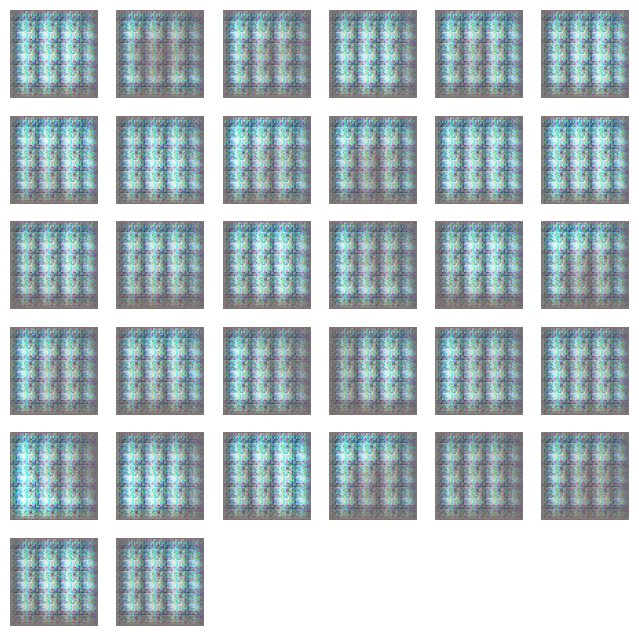

Time for epoch 1 is 203.68 sec

Epoch [2/13] - Generator Loss: 0.6583, Discriminator Loss: 1.1836


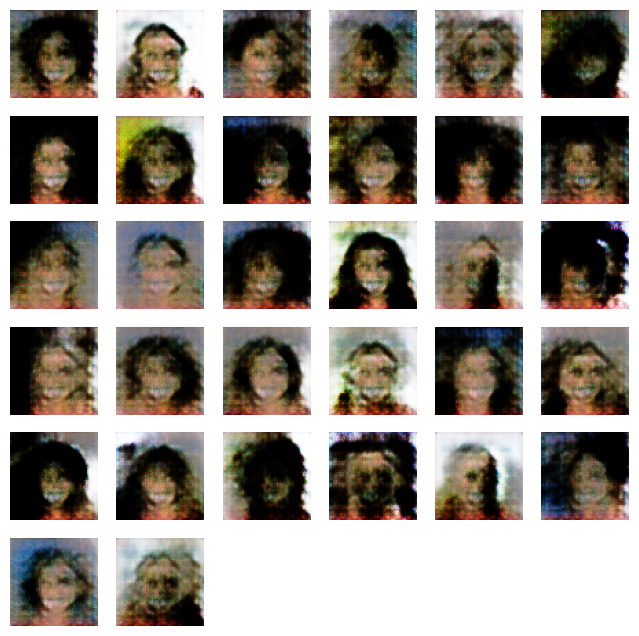

Time for epoch 2 is 202.16 sec

Epoch [3/13] - Generator Loss: 0.6622, Discriminator Loss: 1.1140


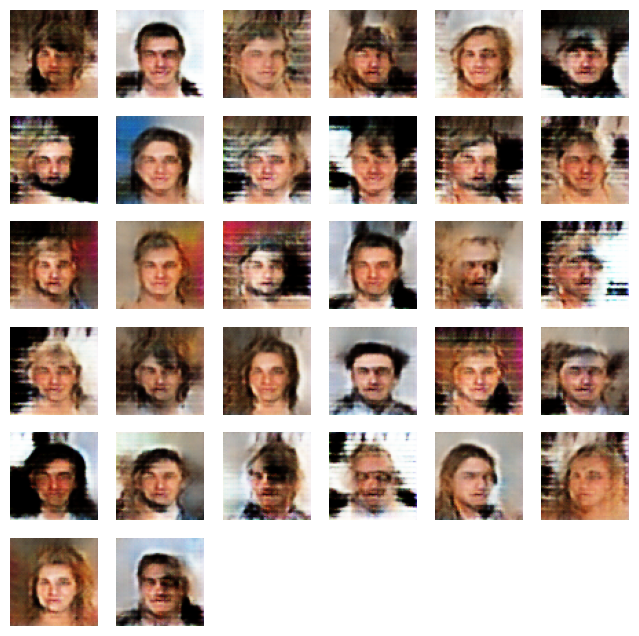

Time for epoch 3 is 201.87 sec

Epoch [4/13] - Generator Loss: 0.6587, Discriminator Loss: 1.1443


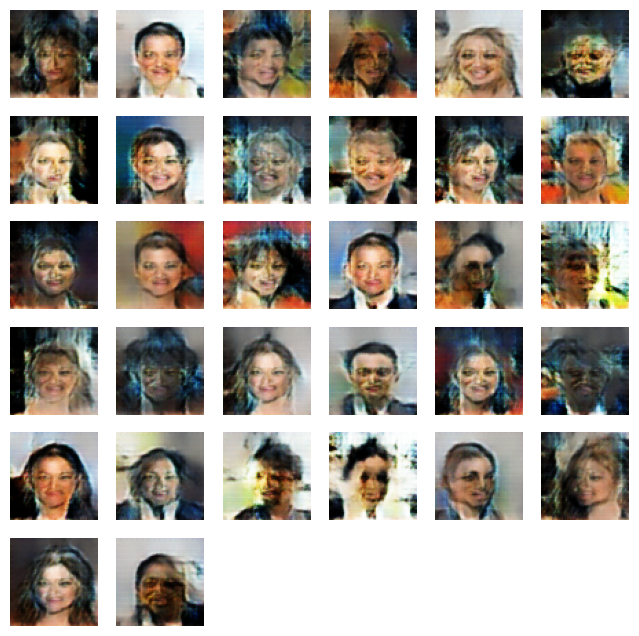

Time for epoch 4 is 201.76 sec

Epoch [5/13] - Generator Loss: 0.6438, Discriminator Loss: 1.1824


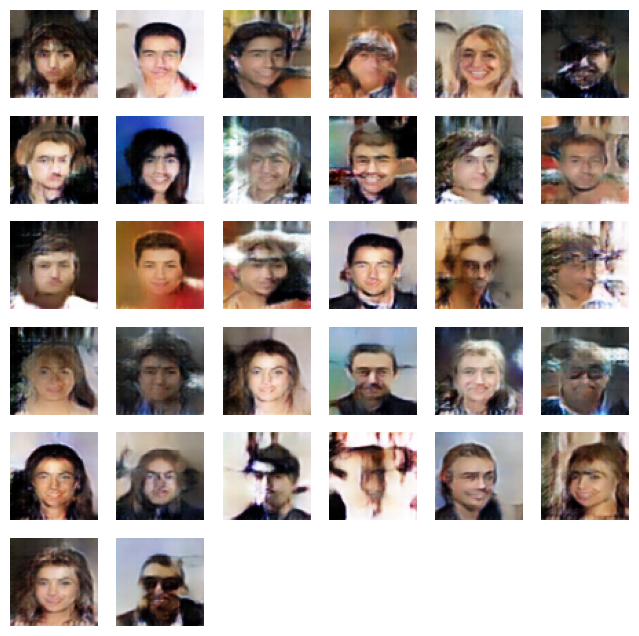

Time for epoch 5 is 201.85 sec

Epoch [6/13] - Generator Loss: 0.6342, Discriminator Loss: 1.2193


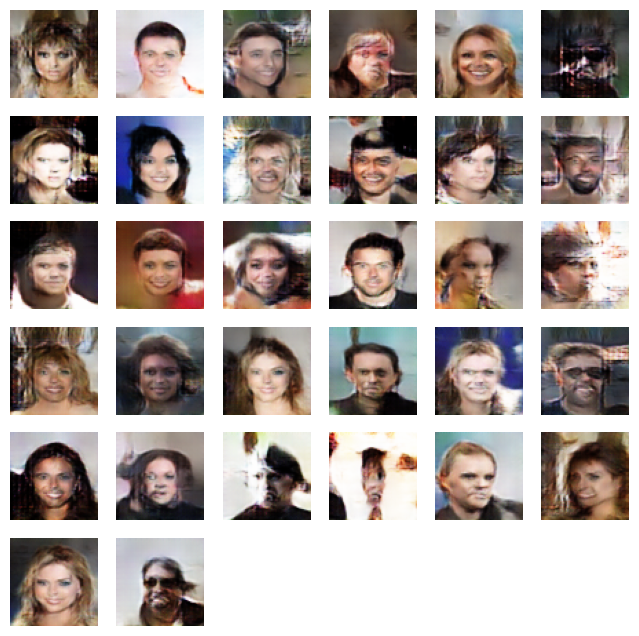

Time for epoch 6 is 201.56 sec

Epoch [7/13] - Generator Loss: 0.6353, Discriminator Loss: 1.2035


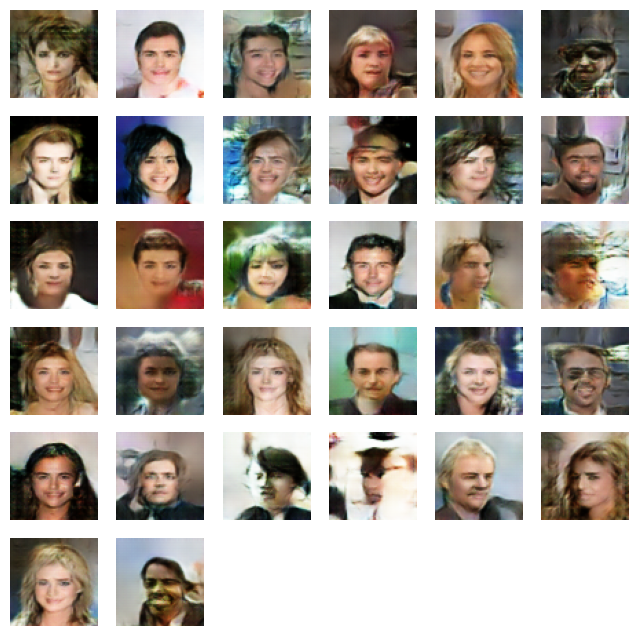

Time for epoch 7 is 201.60 sec

Epoch [8/13] - Generator Loss: 0.6390, Discriminator Loss: 1.1985


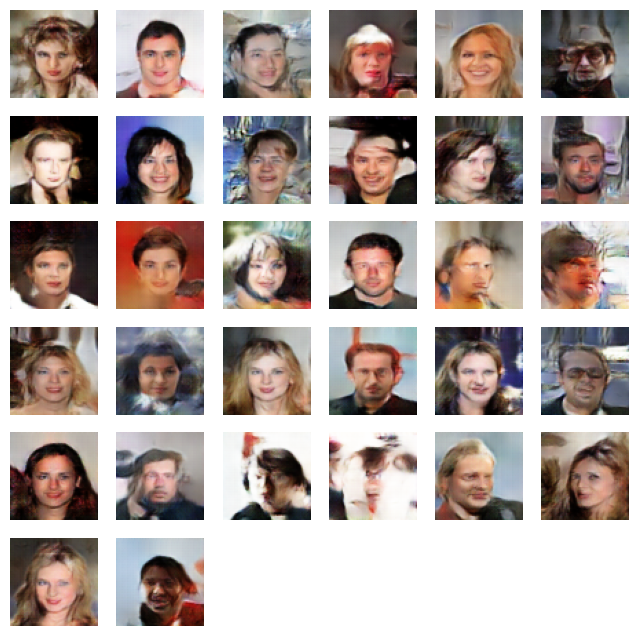

Time for epoch 8 is 201.72 sec

Epoch [9/13] - Generator Loss: 0.6439, Discriminator Loss: 1.1744


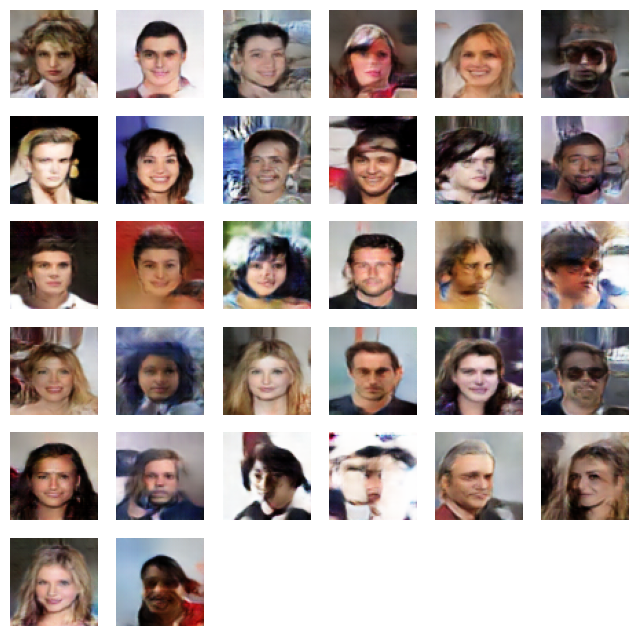

Time for epoch 9 is 201.61 sec

Epoch [10/13] - Generator Loss: 0.6487, Discriminator Loss: 1.1639


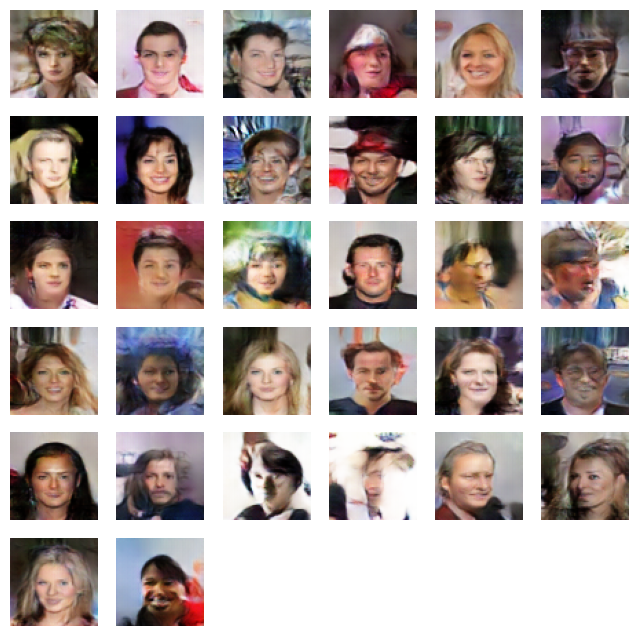

Time for epoch 10 is 201.48 sec

Epoch [11/13] - Generator Loss: 0.6538, Discriminator Loss: 1.1470


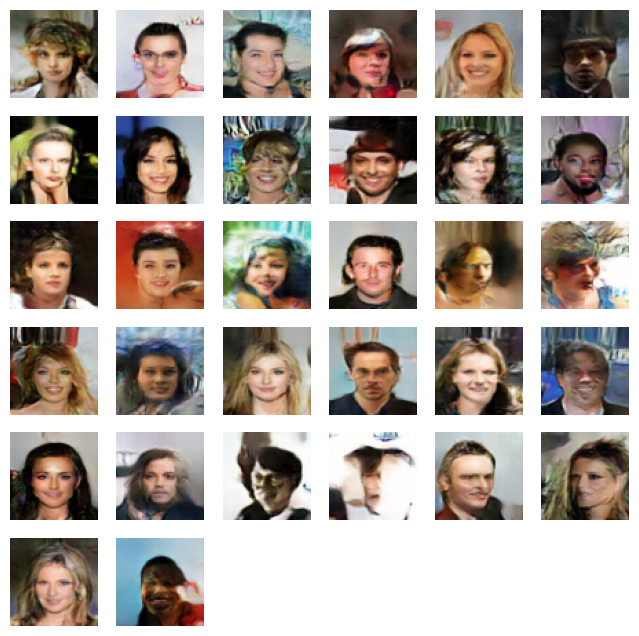

Time for epoch 11 is 201.22 sec

Epoch [12/13] - Generator Loss: 0.6599, Discriminator Loss: 1.1273


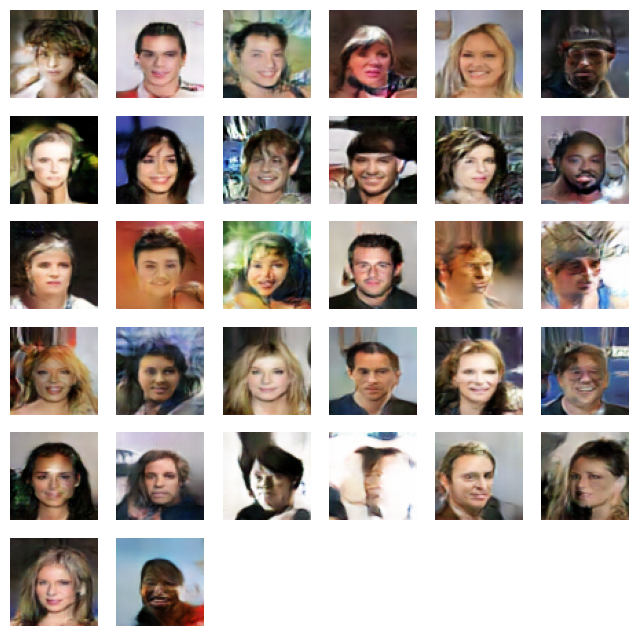

Time for epoch 12 is 201.64 sec

Epoch [13/13] - Generator Loss: 0.6618, Discriminator Loss: 1.1291


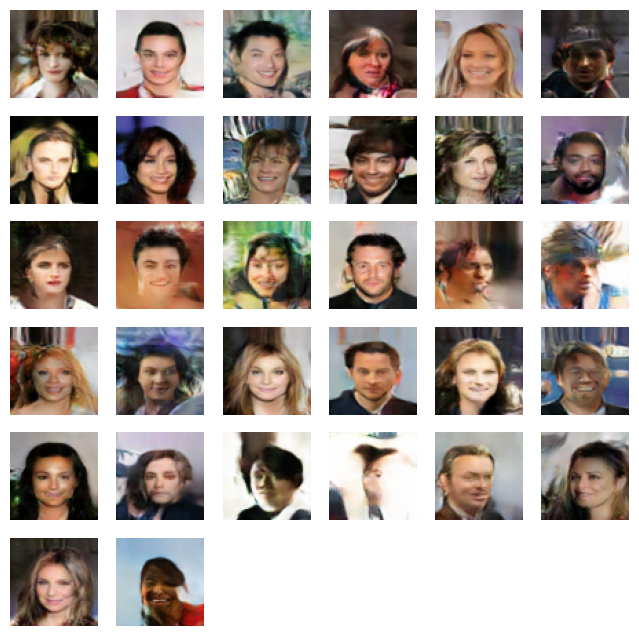

Time for epoch 13 is 201.83 sec



In [10]:
train(dataloader, NUM_EPOCHS, generator, discriminator, gen_optimizer, disc_optimizer, criterion, NOISE_DIM, BATCH_SIZE, fix_noise)

### Check Results

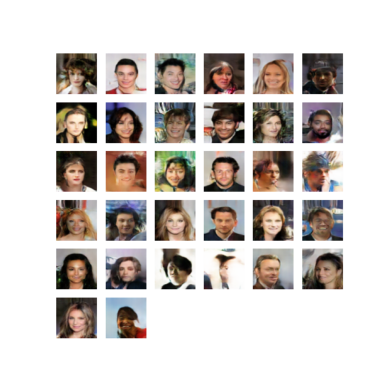

In [11]:
from PIL import Image

def display_image(epoch_no):
    image = Image.open('image_at_epoch_{:04d}.png'.format(epoch_no))
    return image

image = display_image(NUM_EPOCHS)
plt.imshow(image)
plt.axis('off')  # Hide axis
plt.show()

In [12]:
import imageio.v2 as imageio
import glob

def create_animation(image_folder, output_file):
    filenames = sorted(glob.glob(f'{image_folder}/image*.png'))
    with imageio.get_writer(output_file, mode='I') as writer:
        for filename in filenames:
            image = imageio.imread(filename)
            writer.append_data(image)

# Create the animation
create_animation('./', 'dcgan.gif')

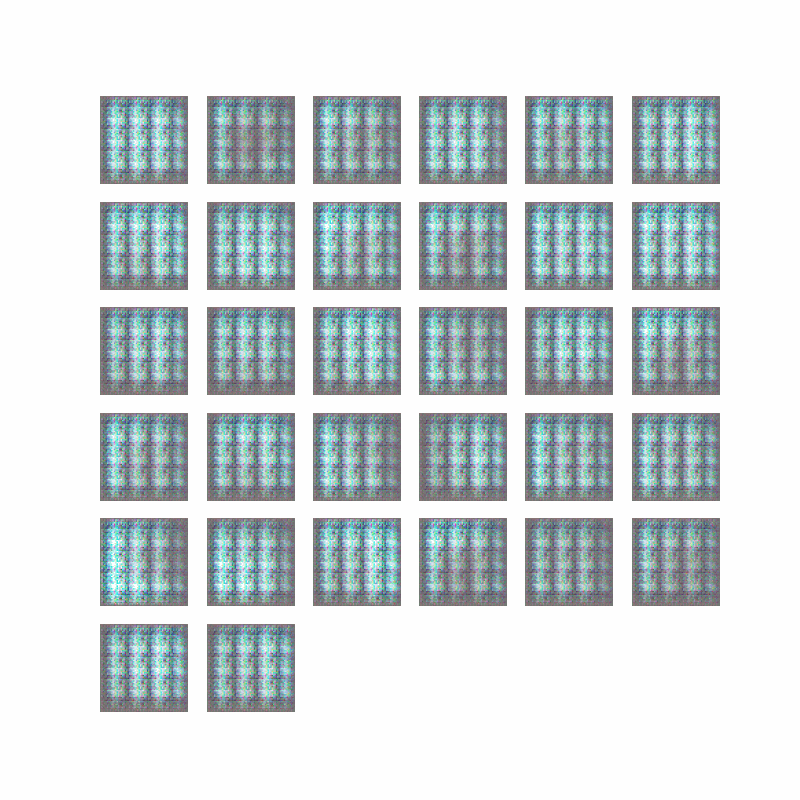

In [13]:
from IPython.display import Image, display

def display_animation(anim_file):
    display(Image(filename=anim_file))

# Display the animation
display_animation('dcgan.gif')

In [14]:
# Assuming generator is your trained generator model
torch.save(generator.state_dict(), 'generator.pth')


## Notes:
I have taken the template of the code from the tensorflow documentation, then trid to convert the logic into pytorch using pytorch documentation and chatgpt.
first of all, the model was not giving any meaningful results until I introduced the manual seeding. That helps to recreate the results.
But as the generated image starts from a randomly generated noise, every time the training will be different even with the same hyperparameters.
After trying to train 4-5 times with the same hyper-parameters, i have got these significantly good images